# Описание проекта
Cтажировка в отделе маркетинговой аналитики Яндекс.Афиши. 
Первое задание: помочь маркетологам снизить расходы — отказаться от невыгодных источников трафика и перераспределить бюджет.
Есть данные Яндекс.Афиши с июня 2017 по конец мая 2018 года:
лог сервера с данными о посещениях сайта Яндекс.Афиши,
выгрузка всех заказов за этот период,
статистика рекламных расходов.
Нам предстоит изучить:
- как клиенты пользуются сервисом,
- когда делают первые покупки на сайте,
- сколько денег приносит компании каждый клиент,
- когда расходы на привлечение клиента окупаются.
Выручка измеряется в условных единицах — у.е.

**СОДЕРЖАНИЕ:**

[**Шаг 1. Загрузка данных и подготовка их к анализу**](#step1)

[*1.1. Положим данные о визитах, заказах и рекламных расходах в переменные;*](#step1.1)

[*1.2. Подготовим данные. Убедимся, что тип данных во всех колонках соответствует сохранённым в них значениям.*](#step1.2)

[**Шаг 2. Рассчет метрик и построение графиков**](#step2)

[*2.1. Продуктовые метрики*](#step2.1)

[*2.2. Метрики электронной коммерции*](#step2.2)

[*2.3. Маркетинговые метрики*](#step2.3)

[**Шаг 3. Выводы и рекомендации**](#step3)

### Шаг 1. Загрузка данных и подготовка их к анализу. <a name="step1" />

#### 1.1. Положим данные о визитах, заказах и рекламных расходах в переменные; <a name="step1.1" />

Создадим поле для выгрузки всех необходимых библиотек.

In [1]:
import pandas as pd

import numpy as np

import matplotlib

from matplotlib import pyplot as plt

from scipy import stats as st

import plotly as py

import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
sns.set()

import datetime as dt

In [2]:
def upload_file(local, server):
    '''Функция читает дата фрейм, вне зависимости от нахождения файла (на локальной машине или на сервере)'''
    try:
        df = pd.read_csv(local)
    except:
        df = pd.read_csv(server)
    return df

    

In [3]:
def print_common_info(df):    
    '''Функция печатает общую информацию о дата фрейме'''
    df.columns=df.columns.str.lower()
    df.columns=df.columns.str.replace(' ', '_')
    
    print('Выведем 5 первых строк таблицы:','\n', df.head())
    print()
    print('Выведем общую информацию:')
    print()
    df.info() 
    print()
    print('Кол-во дубликатов', df.duplicated().sum())

In [4]:
def show_bars(data, x_axis, y_axis, title='Title'):
    fig = px.bar(data, 
                 x=x_axis, y=y_axis, 
                 color=y_axis, 
                 title=title
                  )
    fig.show()

Загрузим файлы с помощью функции upload_file

In [5]:
visits = upload_file('./datasets/visits_log.csv', '/datasets/visits_log.csv')

In [6]:
orders = upload_file('./datasets/orders_log.csv', '/datasets/orders_log.csv')

In [7]:
costs = upload_file('./datasets/costs.csv', '/datasets/costs.csv')

Выведем общую информацию о файле visits_log.csv, в котором хранится лог сервера с информацией о посещениях сайта.

In [8]:
print_common_info(visits)

Выведем 5 первых строк таблицы: 
     device               end_ts  source_id             start_ts  \
0    touch  2017-12-20 17:38:00          4  2017-12-20 17:20:00   
1  desktop  2018-02-19 17:21:00          2  2018-02-19 16:53:00   
2    touch  2017-07-01 01:54:00          5  2017-07-01 01:54:00   
3  desktop  2018-05-20 11:23:00          9  2018-05-20 10:59:00   
4  desktop  2017-12-27 14:06:00          3  2017-12-27 14:06:00   

                    uid  
0  16879256277535980062  
1    104060357244891740  
2   7459035603376831527  
3  16174680259334210214  
4   9969694820036681168  

Выведем общую информацию:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   device     359400 non-null  object
 1   end_ts     359400 non-null  object
 2   source_id  359400 non-null  int64 
 3   start_ts   359400 non-null  object
 4   uid        359400 non-nu

Структура visits_log.csv
 - Uid — уникальный идентификатор пользователя,
 - Device — категория устройства пользователя,
 - Start Ts — дата и время начала сессии,
 - End Ts — дата и время окончания сессии,
 - Source Id — идентификатор источника перехода на сайт.

Выведем общие данные о файле orders_log.csv, в котором хранится информация о заказах.

In [9]:
print_common_info(orders)

Выведем 5 первых строк таблицы: 
                 buy_ts  revenue                   uid
0  2017-06-01 00:10:00    17.00  10329302124590727494
1  2017-06-01 00:25:00     0.55  11627257723692907447
2  2017-06-01 00:27:00     0.37  17903680561304213844
3  2017-06-01 00:29:00     0.55  16109239769442553005
4  2017-06-01 07:58:00     0.37  14200605875248379450

Выведем общую информацию:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   buy_ts   50415 non-null  object 
 1   revenue  50415 non-null  float64
 2   uid      50415 non-null  uint64 
dtypes: float64(1), object(1), uint64(1)
memory usage: 1.2+ MB

Кол-во дубликатов 0


Структура orders_log.csv
 - Uid — уникальный идентификатор пользователя,
 - Buy Ts — дата и время заказа,
 - Revenue — сумма заказа.

Выведем общие данные о файле costs.csv, в котором хранится информация о заказах.

In [10]:
print_common_info(costs)

Выведем 5 первых строк таблицы: 
    source_id          dt  costs
0          1  2017-06-01  75.20
1          1  2017-06-02  62.25
2          1  2017-06-03  36.53
3          1  2017-06-04  55.00
4          1  2017-06-05  57.08

Выведем общую информацию:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   source_id  2542 non-null   int64  
 1   dt         2542 non-null   object 
 2   costs      2542 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 59.7+ KB

Кол-во дубликатов 0


Структура costs.csv
 - source_id — идентификатор рекламного источника,
 - dt — дата проведения рекламной кампании,
 - costs — расходы на эту кампанию.

Мы выгрузили и ознакомились с данными трех таблиц. В таблицах нет пропусков, дубликатов, названия столбцов приведены к нижнему регистру и вместо пробелов мы подставили нижнее подчеркивание для удобства в дальнейшей работе.

#### 1.2. Подготовим данные. Убедимся, что тип данных во всех колонках соответствует сохранённым в них значениям.<a name="step1.2" />

Приведем данные к нужным форматам. В наших таблицах данные , содержащие даты, имеют тип данных object. Преобразуем их к формату даты с помощью метода pd.to_datetime.

In [11]:
visits['start_ts'] = pd.to_datetime(visits['start_ts'])

In [12]:
visits['end_ts'] = pd.to_datetime(visits['end_ts'])

In [13]:
orders['buy_ts'] = pd.to_datetime(orders['buy_ts'])

In [14]:
costs['dt'] = pd.to_datetime(costs['dt'])

Выведем информацию о трех таблицах, чтобы сверить форматы.

In [15]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   device     359400 non-null  object        
 1   end_ts     359400 non-null  datetime64[ns]
 2   source_id  359400 non-null  int64         
 3   start_ts   359400 non-null  datetime64[ns]
 4   uid        359400 non-null  uint64        
dtypes: datetime64[ns](2), int64(1), object(1), uint64(1)
memory usage: 13.7+ MB


In [16]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   buy_ts   50415 non-null  datetime64[ns]
 1   revenue  50415 non-null  float64       
 2   uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [17]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


Данные предобработаны, можно приступать к следующему шагу.

### Шаг 2. Рассчет метрик и построение графиков. <a name="step2" />

#### 2.1. Продуктовые метрики. <a name="step2.1" />

**Рассчитаем DAU, WAU и MAU. Вычислим средние значения этих метрик за весь период. Отобразим изменения метрик во времени на графиках**

Изучим пользовательскую активность, для этого нам понадобятся данные из таблицы о визитах visits_log. В ней есть информация об id пользователя, времени начала и окончания сессии.

Чтобы посчитать недельное и месячное использование, выделим в отдельные столбцы год, месяц и неделю, а также полную дату.

In [18]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   device     359400 non-null  object        
 1   end_ts     359400 non-null  datetime64[ns]
 2   source_id  359400 non-null  int64         
 3   start_ts   359400 non-null  datetime64[ns]
 4   uid        359400 non-null  uint64        
dtypes: datetime64[ns](2), int64(1), object(1), uint64(1)
memory usage: 13.7+ MB


In [19]:
visits['session_year']  = visits['start_ts'].dt.year
visits['session_month'] = visits['start_ts'].dt.month
visits['session_week']  = visits['start_ts'].dt.week
visits['session_date'] = visits['start_ts'].dt.date

Посчитаем метрики. Сгруппируем данные по уникальным пользователям и найдём среднее:

In [20]:
dau_total = visits.groupby('session_date').agg({'uid': 'nunique'}).mean()
wau_total = ( visits.groupby(['session_year', 'session_week']) .agg({'uid': 'nunique'}).mean())
mau_total = (visits.groupby(['session_year', 'session_month']).agg({'uid': 'nunique'}).mean())
print('DAU – число уникальных пользователей в день составило:', (int(dau_total)))
print('WAU – число уникальных пользователей в неделю составило:', (int(wau_total))) 
print('MAU – число уникальных пользователей в месяц составило:', (int(mau_total))) 

DAU – число уникальных пользователей в день составило: 907
WAU – число уникальных пользователей в неделю составило: 5716
MAU – число уникальных пользователей в месяц составило: 23228


Теперь построим графики по данным показателям:

In [21]:
visits['session_date'] = visits['start_ts'].astype('datetime64[D]')

day = visits.groupby('session_date').agg({'uid': 'nunique'}).reset_index()
fig = px.line(day,  x='session_date', y='uid',  title="Количество пользователей в день")
fig.show()

В день среднее значение по количеству пользователей составило 907. Постепенное увеличение с лета до нового года. В декабре мы наблюдаем пик, допускаю, что он связан с закупками перед новым годом . Вероятно именно в это время была очень мощная рекламная кампания. В апреле ощутимый спад, что логично, в апреле ни одного государственного праздника). 

In [22]:
visits['session_week'] = visits['start_ts'].astype('datetime64[W]')
week = visits.groupby(['session_year', 'session_week']).agg({'uid': 'nunique'}).reset_index() 

fig = px.line(week,  x='session_week', y='uid', title="Количество пользователей в неделю")
fig.show()

Среднее значение по количеству пользователей за неделю составило  5825 человек. Данное укрупнение графика лишь подтверждает наличие сезонности, зимой люди чаще ходят на мероприятия, возможно даже пик пришелся в связи с сезонными детскими елками, а в январе спад кажется логичным, люди торопятся покупать до нового года, чтобы в выходные ни о чем уже не беспокоиться. 

In [23]:
visits['session_month'] = visits['start_ts'].astype('datetime64[M]')
month = visits.groupby(['session_year', 'session_month']).agg({'uid': 'nunique'}).reset_index() 

fig = px.line(month,  x='session_month', y='uid', title="Количество пользователей в месяц")
fig.show()   

Среднее значение пользователей в месяц - 23228. Мы видим самые низкие значения в августе. Предположительно, это связано с началом учебного года. В это время у населения после отпусков и дач деньги остаются только на учебники и форму)) Видимо!

Посчитаем,сколько раз за день пользователи в среднем заходят на сайт. Построим график, отражающий изменения метрики во времени

In [24]:
sessions_per_user = visits.groupby(['session_year', 'session_month', 'session_date']).agg({'uid': ['count', 'nunique']})
sessions_per_user.columns = ['n_sessions', 'n_users']
sessions_per_user['sessions_per_user'] = (sessions_per_user['n_sessions'] / sessions_per_user['n_users'])
sessions_per_user = sessions_per_user.reset_index()
#sessions_per_user
fig = px.line(sessions_per_user,  x='session_date', y='sessions_per_user', title="Количество сессий в день")
fig.show()   

In [25]:
sessions_per_user.mean()

session_year         2017.412088
n_sessions            987.362637
n_users               907.991758
sessions_per_user       1.082170
dtype: float64

График похож на график с DAU. Это может говорить о том, что количество пользователей приблизительно равно количеству сессий). По крайней мере, на глаз)

**Выясним, сколько времени пользователи проводят на сайте и какова продолжительность типичной пользовательской сессии за весь период.**

Нам известны данные о начале и конце сессии, выясним какова продолжительность типичной пользовательской сессии, возьмем медианное значение.

In [26]:
visits['session_duration_sec'] = (visits['end_ts'] - visits['start_ts']).dt.seconds
visits['session_duration_min']= visits['session_duration_sec']/60
asl = round(visits['session_duration_min'].median(),2)
fig = px.histogram(visits, x="session_duration_sec" )
fig.show()

In [27]:
print('Продолжительность типичной пользовательской сессии ASL =', asl, 'минут')

Продолжительность типичной пользовательской сессии ASL = 5.0 минут


Когда распределение близко к нормальному или нормальное — можно смотреть на среднюю или медиану. Наше — не из таких, рассчитаем моду (значение в выборке, которое встречается чаще всего):

visits['session_duration_min'].mode()

Наиболее часто встречающееся значение равно 1 минуте. По моему личному опыту, за одну минуту можно оформить корзину, а иногда даже расплатиться. Тем более речь идет о покупке билетов на мероприятия. Если человек знает, что хочет купить билет, например, на конкретный концерт, то за 1 минуту вполне можно это сделать. Вопрос в том, все ли пользователи такие решительные, или имеют место быть технические проблемы. Думаю, стоит уточнить этот момент у команды разработчиков.

На всякий случай посмотрим на среднее значение ASL.

In [28]:
visits['session_duration_min'].mean()

10.725108143201632

Почти 11 минут - среднее значение. Думаю, что пока мы не знаем причину коротких сесссий, можно ориентироваться на медиану, которая составила 5 минут. 

**Рассчитаем  Retention Rate, применяя когортный анализ. Изменение метрики во времени на графике. Средний Retention Rate на второй месяц жизни когорт.**

Retention Rate показывает, сколько пользователей из когорты относительно их изначального числа вернулось в последующие периоды.
Определим событие и период — на их основе сформируем когорту. Возьмём дату, когда пользователь впервые проявил активность. Эти данные запишем в объект Series first_visit. Объединим его с исходным датафреймом visits:

Определим событие - первый визит:

In [29]:
first_visit_date = visits.groupby(['uid'])['start_ts'].min()
first_visit_date.head()


uid
11863502262781    2018-03-01 17:27:00
49537067089222    2018-02-06 15:55:00
297729379853735   2017-06-07 18:47:00
313578113262317   2017-09-18 22:49:00
325320750514679   2017-09-30 14:29:00
Name: start_ts, dtype: datetime64[ns]

Определим период. И сформируем когорту. Возьмём дату, когда пользователь впервые посетил сайт.
Эти данные запишем в объект Series first_visit_date. Объединим его с исходным датафреймом visits:

In [30]:
first_visit_date.name = 'first_visit_date'
visits = visits.join(first_visit_date,on='uid') 
visits.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,session_duration_min,first_visit_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,2017-12-01,2017-12-14,2017-12-20,1080,18.0,2017-12-20 17:20:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2018-02-01,2018-02-15,2018-02-19,1680,28.0,2018-02-19 16:53:00
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,2017-07-01,2017-06-29,2017-07-01,0,0.0,2017-07-01 01:54:00
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,2018-05-01,2018-05-17,2018-05-20,1440,24.0,2018-03-09 20:05:00
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,2017-12-01,2017-12-21,2017-12-27,0,0.0,2017-12-27 14:06:00


В таблице появился столбец first_visit_date с датами первой покупки клиента.
Следующим шагом выделим из столбцов first_visit_date и start_ts месяцы. Вызовем метод astype(): преобразуем значения столбцов к типу 'datetime64[M]'. [M] в типе datetime64 означает размерность временной метки, в этом случае — месяц:

In [31]:
visits['first_visit_month'] = visits['first_visit_date'].astype(
    'datetime64[M]'
)
visits['visit_month'] = visits['start_ts'].astype('datetime64[M]')
visits.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,session_duration_min,first_visit_date,first_visit_month,visit_month
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,2017-12-01,2017-12-14,2017-12-20,1080,18.0,2017-12-20 17:20:00,2017-12-01,2017-12-01
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2018-02-01,2018-02-15,2018-02-19,1680,28.0,2018-02-19 16:53:00,2018-02-01,2018-02-01
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,2017-07-01,2017-06-29,2017-07-01,0,0.0,2017-07-01 01:54:00,2017-07-01,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,2018-05-01,2018-05-17,2018-05-20,1440,24.0,2018-03-09 20:05:00,2018-03-01,2018-05-01
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,2017-12-01,2017-12-21,2017-12-27,0,0.0,2017-12-27 14:06:00,2017-12-01,2017-12-01


Когортой станет столбец first_visit_month — месяц, в котором было  первое посещение. Сгруппируем данные по этому столбцу и оценим показатели каждой когорты. Применим знакомый agg. Ему передают словарь, где ключи — названия столбцов, а значения — агрегирующие функции.

In [32]:
cohort_grouped = visits.groupby('first_visit_month').agg(
    {'uid': 'nunique', 'session_duration_sec': 'sum'}
)
print(cohort_grouped) 

                     uid  session_duration_sec
first_visit_month                             
2017-06-01         13259              34292438
2017-07-01         13140              15782855
2017-08-01         10181              11258443
2017-09-01         16704              17178512
2017-10-01         25977              26044026
2017-11-01         27248              31765319
2017-12-01         25268              23609275
2018-01-01         22624              18727949
2018-02-01         22197              17160162
2018-03-01         20589              15337597
2018-04-01         15709              10890365
2018-05-01         15273               9229291


Теперь для каждой строки датафрейма можно рассчитать lifetime пользователя в рамках когорты. 

In [33]:
visits['cohort_lifetime'] = (visits['visit_month'] - visits['first_visit_month'])
visits['cohort_lifetime'] = visits['cohort_lifetime'] / np.timedelta64(1, 'M')
visits['cohort_lifetime'] = visits['cohort_lifetime'].round().astype('int') 

Сгруппируем данные по когорте и lifetime. Посчитаем для каждой когорты количество активных пользователей на определённый «месяц жизни»:

In [34]:
cohorts = visits.groupby(['first_visit_month','cohort_lifetime']).agg({'uid':'nunique'}).reset_index()

Чтобы найти Retention Rate, нужно сперва получить число пользователей, изначально бывших в когорте, и на него разделить число пользователей в каждую следующую неделю.
Найдём исходное количество пользователей в когорте. Возьмём их число на нулевую неделю:

In [35]:
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_visit_month', 'uid']]
print(initial_users_count) 

   first_visit_month    uid
0         2017-06-01  13259
12        2017-07-01  13140
23        2017-08-01  10181
33        2017-09-01  16704
42        2017-10-01  25977
50        2017-11-01  27248
57        2017-12-01  25268
63        2018-01-01  22624
68        2018-02-01  22197
72        2018-03-01  20589
75        2018-04-01  15709
77        2018-05-01  15273


Переименуем столбец uid в cohort_users методом rename(). Параметру columns передадим словарь, где ключ — старое название столбца, а значение — новое:

In [36]:
initial_users_count = initial_users_count.rename(columns={'uid':'cohort_users'}) 

Объединим данные по когортам с исходным количеством пользователей в когорте:

In [37]:
cohorts = cohorts.merge(initial_users_count,on='first_visit_month')

Наконец, рассчитаем Retention Rate. Разделим количество активных пользователей в каждый из месяцев на исходное число пользователей в когорте:

In [38]:
cohorts['retention'] = cohorts['uid']/cohorts['cohort_users'] 

Построим сводную таблицу и создадим тепловую карту:

In [39]:
retention_pivot = cohorts.pivot_table(
    index='first_visit_month',
    columns='cohort_lifetime',
    values='retention',
    aggfunc='mean',
)


retention_pivot = retention_pivot.drop([0], axis=1)
print(retention_pivot)

cohort_lifetime          1         2         3         4         5         6   \
first_visit_month                                                               
2017-06-01         0.078664  0.053775  0.061392  0.068557  0.071423  0.061015   
2017-07-01         0.056088  0.051294  0.056164  0.058219  0.048174  0.045358   
2017-08-01         0.076908  0.062862  0.062764  0.050093  0.044004  0.036342   
2017-09-01         0.085489  0.069205  0.050706  0.039392  0.037835  0.035860   
2017-10-01         0.078608  0.052239  0.038958  0.034261  0.032221  0.021365   
2017-11-01         0.078281  0.044113  0.038682  0.033727  0.023415  0.021800   
2017-12-01         0.055802  0.037993  0.031107  0.020263  0.019036       NaN   
2018-01-01         0.059715  0.039339  0.024973  0.020244       NaN       NaN   
2018-02-01         0.057080  0.025454  0.020093       NaN       NaN       NaN   
2018-03-01         0.041818  0.027053       NaN       NaN       NaN       NaN   
2018-04-01         0.048380 

<function matplotlib.pyplot.show(close=None, block=None)>

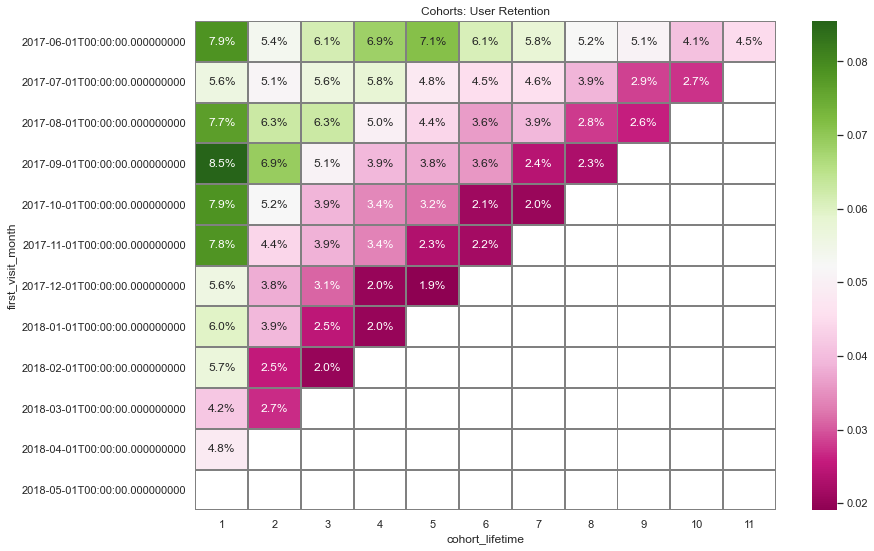

In [40]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
plt.yticks(rotation=0)
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, cmap='PiYG', linecolor='gray')
plt.show

Мы скрыли столбец с первым удержанием , чтобы лучше рассмотреть изменения на тепловой карте. Т.к. в первом удержании данные всегда равны 100% .По карте видно, что с течением времени пользователи все реже возвращаются, т.е. Rate retention снижается. Самый большой показатель был по сентябрьской когорте в 1 и 2 месяцах. Хотелось бы узнать, что такого предприняли маркетологи в этот момент. Может была какая-то крупная кампания, пересмотр целевой аудитории, рассылка с каким-то заманчивым предложением? Кажется, что пора опять взбодрить наших потенциальных клиентов.

Найдем средний Retention Rate на второй месяц «жизни» когорт. Помним, что мы скрыли первый месяц, в котором были все данные по 100%

In [41]:
retention_mean2 = retention_pivot[1].mean()
print('средний Retention Rate на второй месяц «жизни» когорт: {:.1%}'.format(retention_mean2))

средний Retention Rate на второй месяц «жизни» когорт: 6.5%


#### 2.2. Метрики электронной коммерции. <a name="step2.2" />

**Узнаем, сколько времени в среднем проходит с момента первого посещения сайта до совершения покупки**

Определим дату первой покупки.

In [42]:
first_order = orders.groupby('uid')['buy_ts'].min().reset_index()
first_order

,uid,buy_ts
0,313578113262317,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00
3,2464366381792757,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00
...,...,...
36518,18445147675727495770,2017-11-24 09:03:00
36519,18445407535914413204,2017-09-22 23:55:00
36520,18445601152732270159,2018-03-26 22:54:00
36521,18446156210226471712,2018-02-18 19:34:00


переименуем столбец buy_ts , назовем новый столбец first_order

In [43]:
first_order.columns = ['uid','first_order']
first_order

,uid,first_order
0,313578113262317,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00
3,2464366381792757,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00
...,...,...
36518,18445147675727495770,2017-11-24 09:03:00
36519,18445407535914413204,2017-09-22 23:55:00
36520,18445601152732270159,2018-03-26 22:54:00
36521,18446156210226471712,2018-02-18 19:34:00


In [44]:
visits.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,session_duration_min,first_visit_date,first_visit_month,visit_month,cohort_lifetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,2017-12-01,2017-12-14,2017-12-20,1080,18.0,2017-12-20 17:20:00,2017-12-01,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2018-02-01,2018-02-15,2018-02-19,1680,28.0,2018-02-19 16:53:00,2018-02-01,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,2017-07-01,2017-06-29,2017-07-01,0,0.0,2017-07-01 01:54:00,2017-07-01,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,2018-05-01,2018-05-17,2018-05-20,1440,24.0,2018-03-09 20:05:00,2018-03-01,2018-05-01,2
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,2017-12-01,2017-12-21,2017-12-27,0,0.0,2017-12-27 14:06:00,2017-12-01,2017-12-01,0


Добавим столбец о первом посещении (из таблицы visit)

In [45]:
first_order_date = first_order.merge(first_visit_date, on='uid')
first_order_date

,uid,first_order,first_visit_date
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00
...,...,...,...
36518,18445147675727495770,2017-11-24 09:03:00,2017-08-20 13:30:00
36519,18445407535914413204,2017-09-22 23:55:00,2017-09-22 23:48:00
36520,18445601152732270159,2018-03-26 22:54:00,2017-08-07 11:51:00
36521,18446156210226471712,2018-02-18 19:34:00,2017-11-07 10:01:00


Приведем даты к нужному формату, округлив до дня.

In [46]:
first_order_date['first_order'] = first_order_date['first_order'].astype('datetime64[D]')
first_order_date['first_start_ts'] = first_order_date['first_visit_date'].astype('datetime64[D]')
first_order_date.head()

,uid,first_order,first_visit_date,first_start_ts
0,313578113262317,2018-01-03,2017-09-18 22:49:00,2017-09-18
1,1575281904278712,2017-06-03,2017-06-03 10:13:00,2017-06-03
2,2429014661409475,2017-10-11,2017-10-11 17:14:00,2017-10-11
3,2464366381792757,2018-01-28,2018-01-27 20:10:00,2018-01-27
4,2551852515556206,2017-11-24,2017-11-24 10:14:00,2017-11-24


Посчитаем разницу между датой первой сессии и датой первой покупки

In [47]:
first_order_date['time_for_first_order'] = (first_order_date['first_order'] - first_order_date['first_start_ts']) / np.timedelta64(1,'D')
first_order_date.head()

,uid,first_order,first_visit_date,first_start_ts,time_for_first_order
0,313578113262317,2018-01-03,2017-09-18 22:49:00,2017-09-18,107.0
1,1575281904278712,2017-06-03,2017-06-03 10:13:00,2017-06-03,0.0
2,2429014661409475,2017-10-11,2017-10-11 17:14:00,2017-10-11,0.0
3,2464366381792757,2018-01-28,2018-01-27 20:10:00,2018-01-27,1.0
4,2551852515556206,2017-11-24,2017-11-24 10:14:00,2017-11-24,0.0


Посчитаем среднее время от первого посещения до совершения покупки.

In [48]:
mean_time_from_first_order =  round(first_order_date['time_for_first_order'].mean(),2)
print('Cреднее время от первого посещения до совершения покупки:', mean_time_from_first_order, 'дней' )

Cреднее время от первого посещения до совершения покупки: 16.9 дней


In [49]:
median_time_from_first_order = first_order_date['time_for_first_order'].median()
median_time_from_first_order

0.0

In [50]:
moda_time_from_first_order =first_order_date['time_for_first_order'].mode()
moda_time_from_first_order

0    0.0
dtype: float64

In [51]:
fig = px.histogram(first_order_date, x='time_for_first_order',
                title="Hist for time_for_first_order, days")
fig.show()
#print(type(first_order_date))

Распределение не является нормальным, поэтому мы ориентируемся на моду, соответственно вывод такой: большинство покупок совершаются в день посещения.

**Рассчитайте среднее количество покупок на одного покупателя за определённый период, например за 6 месяцев.**

Посмотрим на распределение дат заказов:

In [52]:
orders['buy_ts'].describe() 

count                   50415
unique                  45991
top       2018-05-31 10:13:00
freq                        9
first     2017-06-01 00:10:00
last      2018-06-01 00:02:00
Name: buy_ts, dtype: object

Изучим файл с расходами:О них известна дата (date) и сумма (costs). Взглянем на распределение:

In [53]:
costs['dt'].describe() 

count                    2542
unique                    364
top       2018-03-03 00:00:00
freq                        7
first     2017-06-01 00:00:00
last      2018-05-31 00:00:00
Name: dt, dtype: object

In [54]:
orders.drop(orders.loc[orders['buy_ts'] > '2018-06-01 00:00:00'].index, inplace=True)

In [55]:
orders.loc[orders['buy_ts'] > '2018-06-01 00:00:00']

,buy_ts,revenue,uid


In [56]:
orders['buy_ts'].describe() 

count                   50414
unique                  45990
top       2018-05-31 10:13:00
freq                        9
first     2017-06-01 00:10:00
last      2018-05-31 23:56:00
Name: buy_ts, dtype: object

Диапазон дат расходов совпадает с датами заказов

Данные почти за год. Удобнее всего сформировать месячные когорты. Выделим месяцы из дат в таблицах с заказами и расходами:

In [57]:
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
costs['month'] = costs['dt'].astype('datetime64[M]') 

Получим месяц первой покупки каждого покупателя:

In [58]:
first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']
print(first_orders.head()) 

                uid first_order_month
0   313578113262317        2018-01-01
1  1575281904278712        2017-06-01
2  2429014661409475        2017-10-01
3  2464366381792757        2018-01-01
4  2551852515556206        2017-11-01


Посчитаем количество новых покупателей (n_buyers) за каждый месяц:

In [59]:
cohort_sizes = (
    first_orders.groupby('first_order_month')
    .agg({'uid': 'nunique'})
    .reset_index()
)
cohort_sizes.columns = ['first_order_month', 'n_buyers']
print(cohort_sizes.head()) 

  first_order_month  n_buyers
0        2017-06-01      2023
1        2017-07-01      1923
2        2017-08-01      1370
3        2017-09-01      2581
4        2017-10-01      4340


Построим когорты. Добавим месяц первой покупки каждого покупателя в таблицу с заказами:

In [60]:
orders_new = pd.merge(orders,first_orders, on='uid')
print(orders_new.head()) 

               buy_ts  revenue                   uid order_month  \
0 2017-06-01 00:10:00    17.00  10329302124590727494  2017-06-01   
1 2017-06-01 00:25:00     0.55  11627257723692907447  2017-06-01   
2 2017-06-01 00:27:00     0.37  17903680561304213844  2017-06-01   
3 2017-06-01 00:29:00     0.55  16109239769442553005  2017-06-01   
4 2017-06-01 07:58:00     0.37  14200605875248379450  2017-06-01   

  first_order_month  
0        2017-06-01  
1        2017-06-01  
2        2017-06-01  
3        2017-06-01  
4        2017-06-01  


Сгруппируем таблицу заказов по месяцу первой покупки и месяцу каждого заказа и посчитаем количество покупок. Сбросим индекс методом reset_index():

In [61]:
cohorts = (
    orders_new.groupby(['first_order_month', 'order_month'])
    .agg({'revenue': 'count'})
    .reset_index()
)
cohorts.columns = ['first_order_month', 'order_month', 'count_orders']
print(cohorts.head()) 

  first_order_month order_month  count_orders
0        2017-06-01  2017-06-01          2354
1        2017-06-01  2017-07-01           177
2        2017-06-01  2017-08-01           174
3        2017-06-01  2017-09-01           226
4        2017-06-01  2017-10-01           292


Добавим в таблицу cohorts данные о том, сколько людей первый раз совершили покупку в каждый месяц:

In [62]:
report = pd.merge(cohort_sizes, cohorts, on='first_order_month')
print(report.head()) 

  first_order_month  n_buyers order_month  count_orders
0        2017-06-01      2023  2017-06-01          2354
1        2017-06-01      2023  2017-07-01           177
2        2017-06-01      2023  2017-08-01           174
3        2017-06-01      2023  2017-09-01           226
4        2017-06-01      2023  2017-10-01           292


Определим возраст (age) когорты.

In [63]:
report['age'] = (
    report['order_month'] - report['first_order_month']
) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')
print(report.head()) 

  first_order_month  n_buyers order_month  count_orders  age
0        2017-06-01      2023  2017-06-01          2354    0
1        2017-06-01      2023  2017-07-01           177    1
2        2017-06-01      2023  2017-08-01           174    2
3        2017-06-01      2023  2017-09-01           226    3
4        2017-06-01      2023  2017-10-01           292    4


Посчитаем количество покупок на 1 покупателя.

In [64]:
report['orders_per_bayer'] = report['count_orders'] / report['n_buyers']

Построим сводную таблицу и определим по ней, какие когорты прожили больше 6 месяцев

In [65]:
output = report.pivot_table(
    index='first_order_month', columns='age', values='orders_per_bayer', aggfunc='mean'
)
output = output.cumsum(axis=1)
output

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,1.163618,1.251112,1.337123,1.448838,1.593178,1.700939,1.837370,1.923381,2.028176,2.103806,2.151261,2.193772
2017-07-01,1.136765,1.188768,1.251170,1.305252,1.342694,1.385335,1.417057,1.443058,1.473219,1.485699,1.513261,NaN
2017-08-01,1.118978,1.197810,1.270803,1.329927,1.391971,1.437226,1.472993,1.529927,1.563504,1.597080,NaN,NaN
2017-09-01,1.136381,1.221232,1.283611,1.347152,1.373111,1.415343,1.457187,1.478884,1.502518,NaN,NaN,NaN
2017-10-01,1.143779,1.216129,1.253456,1.281567,1.311290,1.335023,1.354839,1.383641,NaN,NaN,NaN,NaN
2017-11-01,1.179368,1.276648,1.321245,1.372948,1.406273,1.420730,1.445724,NaN,NaN,NaN,NaN,NaN
2017-12-01,1.152635,1.214237,1.260324,1.301164,1.320785,1.344741,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,1.121554,1.187963,1.235102,1.254076,1.277201,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,1.121611,1.182416,1.205149,1.224322,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


6 месяцев прожили когорты с 2017-06-01 по 2017-12-01.

<function matplotlib.pyplot.show(close=None, block=None)>

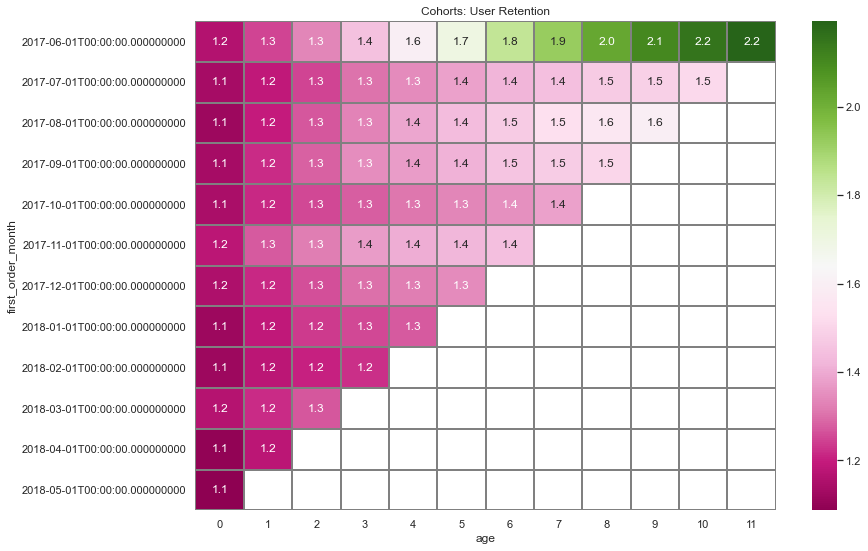

In [66]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
plt.yticks(rotation=45)
sns.heatmap(output, annot=True,fmt='.1f' , linewidths=1, cmap='PiYG', linecolor='gray')
plt.show

In [67]:
orders_per_bayer_mean = output[5].mean()
print('среднее число заказов на клиента за полгода: {:.1f}'.format(orders_per_bayer_mean))

среднее число заказов на клиента за полгода: 1.4


**Рассчитаем средний чек, применяя группировку по времени совершения покупки.Построим график, отражающий изменения метрики во времени**

Посчитаем средний чек по  каждому месяцу

In [68]:
orders['buy_month'] = orders['buy_ts'].astype('datetime64[M]')
revenue_cohorts = round(orders.groupby(['buy_month']).agg({'revenue':'mean'}),2)
revenue_cohorts

,revenue
buy_month,
2017-06-01,4.06
2017-07-01,5.31
2017-08-01,4.85
2017-09-01,5.42
2017-10-01,4.93
2017-11-01,4.78
2017-12-01,5.85
2018-01-01,4.11
2018-02-01,4.84


In [69]:
revenue_cohorts.describe()

,revenue
count,12.000000
mean,4.956667
std,0.521629
min,4.060000
25%,4.777500
50%,4.890000
75%,5.335000
max,5.850000


Средний чек составляет 4.96 у.е.

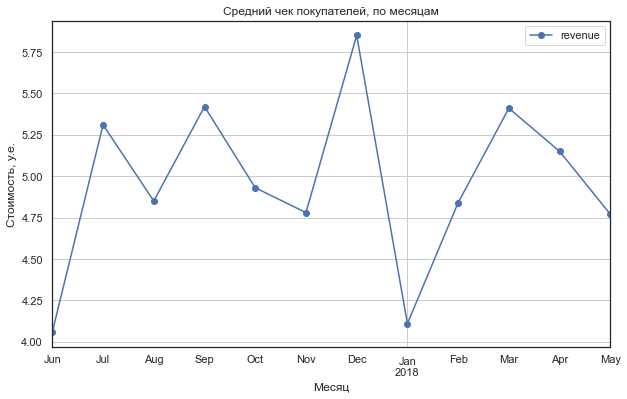

In [70]:
revenue_cohorts.plot(figsize=(10,6), grid=True, style='o-')
plt.ylabel('Стоимость, у.е.')
plt.xlabel('Месяц')
plt.title('Средний чек покупателей, по месяцам')
plt.show()

Мы наблюдаем самый высокий пик в декабре (люди готовятся к долгим каникулам, покупают билеты на елки и т.д.) В январе сильный спад, видимо все запаслись билетами заранее) ну и летом - дачи, отпуска, прогулки на свежем воздухе.Не до походов в кино и театры). Очень интересно было бы провести такой анализ по данным за 2020 год, с учетом того, что именно летом всех выпустили с карантина.

**Выясним, как меняется LTV на покупателя по когортам.Рассчитайте средний LTV по когортам за 6 месяцев; в расчёт включаем когорты, «прожившие» не менее 6 месяцев. Маржинальность сервиса — 100%. Отразим изменения метрики во времени на графике**

LTV (от англ. lifetime value) — «пожизненная» ценность клиента. Это — итоговая сумма денег, которую один клиент приносит в среднем со всех своих покупок. При расчёте LTV обычно обращаются к валовой прибыли с клиента за период.

Мы уже считали когорты по месяцам, теперь мы применим аггрегирующую функцию, в качестве значений возьмем выручку, а в качестве функции - сумму.

In [71]:
cohorts_2 = (
    orders_new.groupby(['first_order_month', 'order_month'])
    .agg({'revenue': 'sum'})
    .reset_index()
)
print(cohorts_2.head()) 

  first_order_month order_month  revenue
0        2017-06-01  2017-06-01  9557.49
1        2017-06-01  2017-07-01   981.82
2        2017-06-01  2017-08-01   885.34
3        2017-06-01  2017-09-01  1931.30
4        2017-06-01  2017-10-01  2068.58


Объединим необходимые таблицы.

In [72]:
report_2= pd.merge(cohort_sizes, cohorts_2, on='first_order_month')
print(report_2.head())

  first_order_month  n_buyers order_month  revenue
0        2017-06-01      2023  2017-06-01  9557.49
1        2017-06-01      2023  2017-07-01   981.82
2        2017-06-01      2023  2017-08-01   885.34
3        2017-06-01      2023  2017-09-01  1931.30
4        2017-06-01      2023  2017-10-01  2068.58


 LTV считают не из выручки, а из валовой прибыли. Значит, нужно найти валовую прибыль, умножив выручку на маржинальность.  Так же найдем возраст когорт

In [73]:
margin_rate = 1

report_2['gp'] = report_2['revenue'] * margin_rate
report_2['age'] = (
    report_2['order_month'] - report_2['first_order_month']
) / np.timedelta64(1, 'M')
report_2['age'] = report_2['age'].round().astype('int')
print(report.head()) 

  first_order_month  n_buyers order_month  count_orders  age  orders_per_bayer
0        2017-06-01      2023  2017-06-01          2354    0          1.163618
1        2017-06-01      2023  2017-07-01           177    1          0.087494
2        2017-06-01      2023  2017-08-01           174    2          0.086011
3        2017-06-01      2023  2017-09-01           226    3          0.111715
4        2017-06-01      2023  2017-10-01           292    4          0.144340


Посчитаем LTV, разделив валовую прибыль на количество покупателей

In [74]:
report_2['ltv'] = report_2['gp'] / report_2['n_buyers']
output_2 = report_2.pivot_table(
    index='first_order_month', columns='age', values='ltv', aggfunc='mean'
)
output_2 = output_2.cumsum(axis=1)
output_2

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,4.724414,5.209743,5.647380,6.602051,7.624582,8.360084,9.310524,9.892116,10.445329,11.051117,11.622378,11.879234
2017-07-01,6.010218,6.345429,6.968960,7.327936,7.504727,7.660775,7.780983,7.922803,8.084035,8.231180,8.386854,NaN
2017-08-01,5.276518,5.748511,6.206993,6.598270,7.092321,7.375861,7.586526,7.991533,8.283745,8.471723,NaN,NaN
2017-09-01,5.644529,6.762115,7.283045,11.258838,11.659396,12.306463,13.008071,13.251220,13.435227,NaN,NaN,NaN
2017-10-01,5.003733,5.539495,5.730889,5.888035,6.039594,6.159956,6.244772,6.360242,NaN,NaN,NaN,NaN
2017-11-01,5.154683,5.553916,5.753472,6.078424,6.226437,6.280316,6.395244,NaN,NaN,NaN,NaN,NaN
2017-12-01,4.738191,4.998565,5.923662,6.988937,7.301866,7.639913,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,4.135636,4.430394,4.734675,4.877453,4.940151,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,4.156987,4.435262,4.513777,4.587921,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Построим теперь график накопительного LTV каждой когорты

<function matplotlib.pyplot.show(close=None, block=None)>

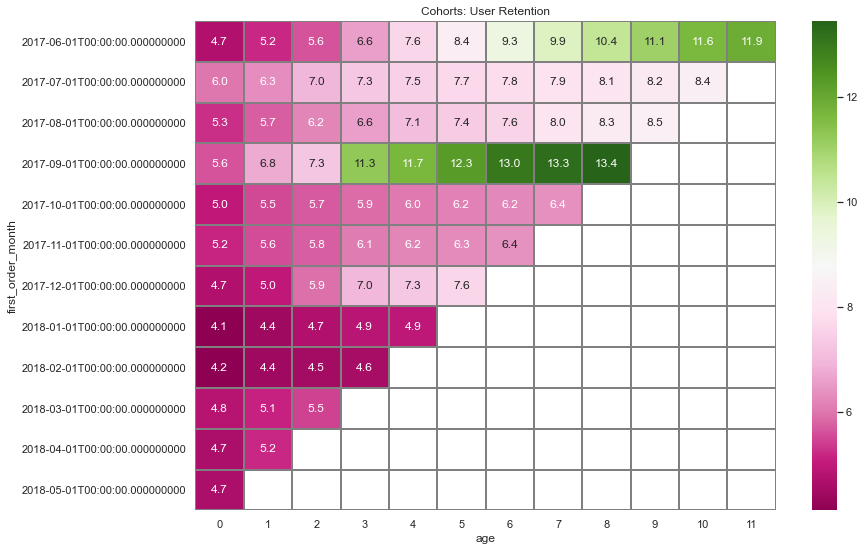

In [75]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
plt.yticks(rotation=45)
sns.heatmap(output_2, annot=True,fmt='.1f' , linewidths=1, cmap='PiYG', linecolor='gray')
plt.show

мы опять наблюдаем удивительные показатели по сентябрьской и июньской когортам. Маркетологи молодцы. Вопрос открытый, что именно сделали маркетологи в зимний период?)

#### 2.3. Маркетинговые метрики. <a name="step2.3" />

Посчитаем и отобразим на графиках, как маркетинговые метрики различаются по рекламным источникам.
Один и тот же пользователь мог заходить на сайт из нескольких источников, поэтому важно определить «главный» источник для каждого и учитывать это в расчётах.
Например, главным может стать первый источник перехода.


**Посчитайте общую сумму расходов на маркетинг. Выясните, как траты распределены по источникам. Визуализируйте изменения метрик во времени**

Вспомним таблицу с мааркетинговыми затратами.

In [76]:
costs.head()

,source_id,dt,costs,month
0,1,2017-06-01,75.20,2017-06-01
1,1,2017-06-02,62.25,2017-06-01
2,1,2017-06-03,36.53,2017-06-01
3,1,2017-06-04,55.00,2017-06-01
4,1,2017-06-05,57.08,2017-06-01


Выведем уникальные значения по источникам.

In [77]:
costs['source_id'].unique()

array([ 1,  2,  3,  4,  5,  9, 10], dtype=int64)

Посчитаем общую сумму затрат.

In [78]:
total_costs = costs['costs'].sum()
print('Общие затраты составляют: ', total_costs)

Общие затраты составляют:  329131.62


Построим сводную таблицу по затратам.

In [79]:
costs_for_source_id = costs.pivot_table(
    index ='month',
    columns = 'source_id',
    values = 'costs',
    aggfunc = 'sum'
    
)
costs_for_source_id

source_id,1,2,3,4,5,9,10
month,,,,,,,
2017-06-01,1125.61,2427.38,7731.65,3514.80,2616.12,285.22,314.22
2017-07-01,1072.88,2333.11,7674.37,3529.73,2998.14,302.54,329.82
2017-08-01,951.81,1811.05,6143.54,3217.36,2185.28,248.93,232.57
2017-09-01,1502.01,2985.66,9963.55,5192.26,3849.14,415.62,460.67
2017-10-01,2315.75,4845.00,15737.24,6420.84,5767.40,609.41,627.24
2017-11-01,2445.16,5247.68,17025.34,5388.82,6325.34,683.18,792.36
2017-12-01,2341.20,4897.80,16219.52,7680.47,5872.52,657.98,645.86
2018-01-01,2186.18,4157.74,14808.78,5832.79,5371.52,547.16,614.35
2018-02-01,2204.48,4474.34,14228.56,5711.96,5071.31,551.50,480.88


Построим график распределения затрат по источникам

<AxesSubplot:xlabel='month'>

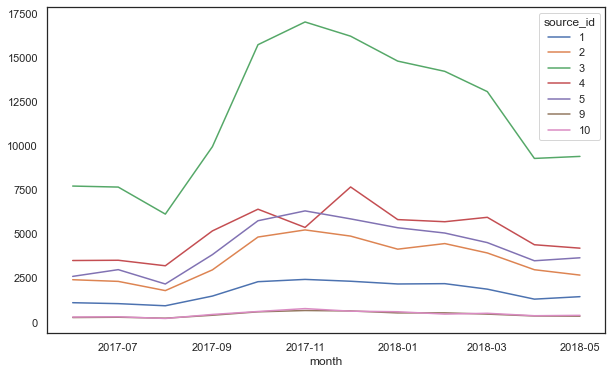

In [80]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
sns.lineplot(ax=ax, data=costs_for_source_id, dashes=False)

По графику видно, что затраты немного снижались в августе.Предполагаю, что была учтена сезонность и опыт прошлых лет. И с сентября был резкий подъем расходов. Вспоминаем прошлые графики и мучавший меня вопрос что такого сделали маркетологи. Ответ почти найден: они потратили крупную часть годового бюджета и теперь мы понимаем, что дело не только в сезонности, но и в хорошо простроенной маркетинговой компании. Самый дорогой источник № 3 , затем по убыванию идут источники 4,5 и 2. Источники 1, 9, 10 - самые низкие и практически не меняющиеся от месяца к месяцу.

**Рассчет среднего CAC на одного покупателя для всего проекта и для каждого источника трафика. Отражение изменений метрик на графиках.**

CAC (от англ. customer acquisition cost) — стоимость привлечения клиента. Сумма денег, во сколько обходится новый клиент компании. Найдем затраты и выручку по каналам.

Посчитаем затраты по месяцам

In [81]:
costs_month = costs.groupby('month')['costs'].sum()

вспоминаем отчет, где есть необходимые нам для дальнейшего расчета данные.

In [82]:
report_2.head()

,first_order_month,n_buyers,order_month,revenue,gp,age,ltv
0,2017-06-01,2023,2017-06-01,9557.49,9557.49,0,4.724414
1,2017-06-01,2023,2017-07-01,981.82,981.82,1,0.485329
2,2017-06-01,2023,2017-08-01,885.34,885.34,2,0.437637
3,2017-06-01,2023,2017-09-01,1931.30,1931.30,3,0.954671
4,2017-06-01,2023,2017-10-01,2068.58,2068.58,4,1.022531


добавляем расходы по месяцам в когортный отчет

In [83]:
report_new = pd.merge(
    report_2, costs_month, left_on='first_order_month', right_on='month'
)
report_new

,first_order_month,n_buyers,order_month,revenue,gp,age,ltv,costs
0,2017-06-01,2023,2017-06-01,9557.49,9557.49,0,4.724414,18015.00
1,2017-06-01,2023,2017-07-01,981.82,981.82,1,0.485329,18015.00
2,2017-06-01,2023,2017-08-01,885.34,885.34,2,0.437637,18015.00
3,2017-06-01,2023,2017-09-01,1931.30,1931.30,3,0.954671,18015.00
4,2017-06-01,2023,2017-10-01,2068.58,2068.58,4,1.022531,18015.00
...,...,...,...,...,...,...,...,...
73,2018-03-01,3533,2018-04-01,1063.05,1063.05,1,0.300892,30415.27
74,2018-03-01,3533,2018-05-01,1114.87,1114.87,2,0.315559,30415.27
75,2018-04-01,2276,2018-04-01,10600.69,10600.69,0,4.657597,22289.38
76,2018-04-01,2276,2018-05-01,1209.92,1209.92,1,0.531599,22289.38


считаем стоимость привлечения клиента

In [84]:
report_new['cac'] = report_new['costs'] / report_new['n_buyers']
report_new['cac'].head()

0    8.905091
1    8.905091
2    8.905091
3    8.905091
4    8.905091
Name: cac, dtype: float64

In [85]:
report_new['cac'].mean()

9.319905176921116

строим график распределения САС по времени жизни когорт

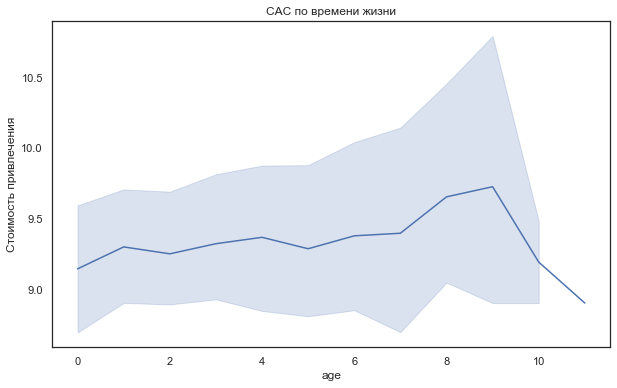

In [86]:
plt.figure(figsize = (10, 6))
ax = sns.lineplot(x = "age", y = "cac", data = report_new)
plt.title('CAC по времени жизни')
ax.set_xlabel('age')
ax.set_ylabel('Стоимость привлечения')
plt.show()

Наблюдаем, как стоимость привлечения клиента верно растет к сентябрю.

Группируем затраты по источнику.

In [87]:
costs_per_source=costs.groupby('source_id')['costs'].sum().reset_index()
costs_per_source

,source_id,costs
0,1,20833.27
1,2,42806.04
2,3,141321.63
3,4,61073.60
4,5,51757.10
5,9,5517.49
6,10,5822.49


Из таблицы visits получим только те данные , при которых выполняется условие: дата начала сессии равна дате первого посещения.

In [88]:
visits_by_source = visits.query('start_ts == first_visit_date')
visits_by_source.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,session_duration_min,first_visit_date,first_visit_month,visit_month,cohort_lifetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,2017-12-01,2017-12-14,2017-12-20,1080,18.0,2017-12-20 17:20:00,2017-12-01,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2018-02-01,2018-02-15,2018-02-19,1680,28.0,2018-02-19 16:53:00,2018-02-01,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,2017-07-01,2017-06-29,2017-07-01,0,0.0,2017-07-01 01:54:00,2017-07-01,2017-07-01,0
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,2017-12-01,2017-12-21,2017-12-27,0,0.0,2017-12-27 14:06:00,2017-12-01,2017-12-01,0
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017,2017-09-01,2017-08-31,2017-09-03,60,1.0,2017-09-03 21:35:00,2017-09-01,2017-09-01,0


Соединим таблицу orders с полученной выше таблицей, сгруппируем по источнику 

In [89]:
buyers_by_source = (orders.merge(visits_by_source, on='uid', how='inner')).groupby('source_id').agg({'uid':'nunique'})\
                        .rename(columns={'uid':'buyers'})
buyers_by_source

,buyers
source_id,
1,2899
2,3506
3,10473
4,10295
5,6931
7,1
9,1088
10,1329


подготовим таблицу для дальнейших манипуляций

In [90]:
buyers_by_source = buyers_by_source.reset_index().rename(columns = {'source id': 'source_id'}) 
buyers_by_source

,source_id,buyers
0,1,2899
1,2,3506
2,3,10473
3,4,10295
4,5,6931
5,7,1
6,9,1088
7,10,1329


соединим таблицу с costs

In [91]:
cac = buyers_by_source.merge(costs_per_source).reset_index()
cac

,index,source_id,buyers,costs
0,0,1,2899,20833.27
1,1,2,3506,42806.04
2,2,3,10473,141321.63
3,3,4,10295,61073.60
4,4,5,6931,51757.10
5,5,9,1088,5517.49
6,6,10,1329,5822.49


Уберем индексы

In [92]:
cac_itog = cac.merge(visits_by_source).reset_index()
cac

,index,source_id,buyers,costs
0,0,1,2899,20833.27
1,1,2,3506,42806.04
2,2,3,10473,141321.63
3,3,4,10295,61073.60
4,4,5,6931,51757.10
5,5,9,1088,5517.49
6,6,10,1329,5822.49


посчитаем САС

In [93]:
cac['cac'] = cac['costs'] / cac['buyers']
cac.sort_values('cac', ascending = False)

,index,source_id,buyers,costs,cac
2,2,3,10473,141321.63,13.493901
1,1,2,3506,42806.04,12.209367
4,4,5,6931,51757.10,7.467479
0,0,1,2899,20833.27,7.186364
3,3,4,10295,61073.60,5.932356
5,5,9,1088,5517.49,5.071222
6,6,10,1329,5822.49,4.381106


Построим график CAC по источнику.

In [94]:
fig = px.bar(cac, x = "source_id", y = "cac",  color="cac" ,title=('САС по источнику'))
fig.show()

Дороже всего нам обходятся клиенты, привлеченные третьим  и вторым источником. Источники 9 и 10 имеют низкие затраты. А 6,7 и 8 - либо бесплатные либо неиспользуемые)

**Рассчет ROMI по когортам в разрезе источников. Сравнение окупаемости за одинаковые периоды жизни когорт. Обратить внимание, что клиенты, пришедшие из разных источников, могут иметь разный LTV. Графики, отражающие изменения метрик во времени.**

Освежаем в памяти наш последний отчет

In [95]:
report_new

,first_order_month,n_buyers,order_month,revenue,gp,age,ltv,costs,cac
0,2017-06-01,2023,2017-06-01,9557.49,9557.49,0,4.724414,18015.00,8.905091
1,2017-06-01,2023,2017-07-01,981.82,981.82,1,0.485329,18015.00,8.905091
2,2017-06-01,2023,2017-08-01,885.34,885.34,2,0.437637,18015.00,8.905091
3,2017-06-01,2023,2017-09-01,1931.30,1931.30,3,0.954671,18015.00,8.905091
4,2017-06-01,2023,2017-10-01,2068.58,2068.58,4,1.022531,18015.00,8.905091
...,...,...,...,...,...,...,...,...,...
73,2018-03-01,3533,2018-04-01,1063.05,1063.05,1,0.300892,30415.27,8.608907
74,2018-03-01,3533,2018-05-01,1114.87,1114.87,2,0.315559,30415.27,8.608907
75,2018-04-01,2276,2018-04-01,10600.69,10600.69,0,4.657597,22289.38,9.793225
76,2018-04-01,2276,2018-05-01,1209.92,1209.92,1,0.531599,22289.38,9.793225


Считаем ROMI

In [96]:
report_new['romi'] = report_new['ltv'] / report_new['cac'] 
report_new['romi'].head()

0    0.530530
1    0.054500
2    0.049145
3    0.107205
4    0.114825
Name: romi, dtype: float64

Строим новую сводную таблицу

In [97]:
result_romi = report_new.pivot_table(
    index='first_order_month', columns='age', values='romi', aggfunc='mean'
)
 
result_romi.cumsum(axis=1).round(2).fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,0.53,0.59,0.63,0.74,0.86,0.94,1.05,1.11,1.17,1.24,1.31,1.33
2017-07-01,0.63,0.67,0.73,0.77,0.79,0.81,0.82,0.84,0.85,0.87,0.88,
2017-08-01,0.49,0.53,0.57,0.61,0.66,0.68,0.7,0.74,0.77,0.78,,
2017-09-01,0.60,0.72,0.77,1.19,1.23,1.3,1.38,1.4,1.42,,,
2017-10-01,0.60,0.66,0.68,0.7,0.72,0.74,0.75,0.76,,,,
2017-11-01,0.55,0.6,0.62,0.65,0.67,0.68,0.69,,,,,
2017-12-01,0.54,0.57,0.68,0.8,0.84,0.87,,,,,,
2018-01-01,0.42,0.45,0.48,0.49,0.5,,,,,,,
2018-02-01,0.46,0.49,0.5,0.51,,,,,,,,


строим тепловую карту

<AxesSubplot:title={'center':'ROMI'}, xlabel='age', ylabel='first_order_month'>

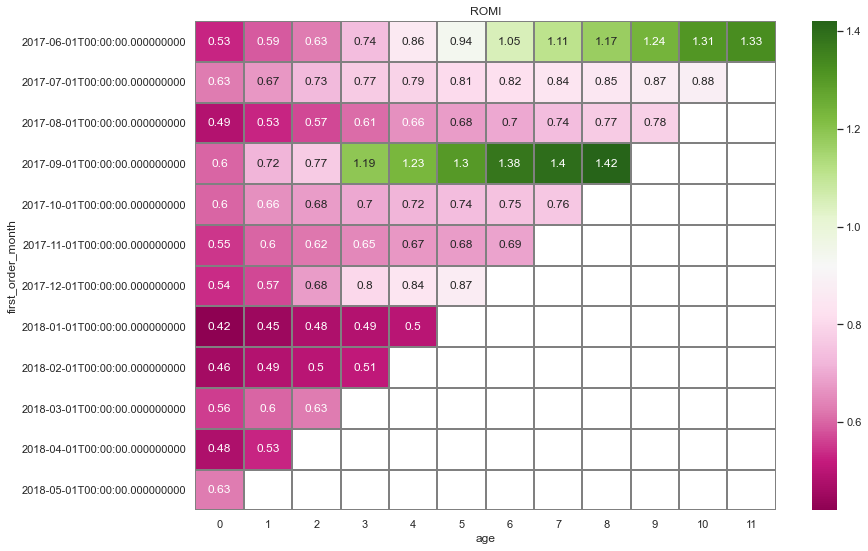

In [98]:
plt.figure(figsize=(13, 9))
plt.title('ROMI')
sns.heatmap(result_romi.cumsum(axis=1).round(2) , annot=True, fmt='.3', linewidths=1,cmap='PiYG', linecolor='gray')

Июньская когорта окупилась на 7 месяц,
Сентябрьская когорта окупилась на 4 месяц.
Остальные пока не окупились.

Вспоминаем таблицу с покупателями.

In [99]:
#orders_new 

In [100]:
buyers_new = (orders_new.merge(visits_by_source, on='uid', how='inner')).groupby(['first_order_month','source_id']).agg({'uid':'nunique'})\
                        .rename(columns={'uid':'buyers'})
buyers_new

buyers
first_order_month source_id        
2017-06-01        1             190
                  2             235
                  3             638
                  4             413
                  5             384
...                             ...
2018-05-01        3             844
                  4             804
                  5             497
                  9              60
                  10            130

[85 rows x 1 columns]

In [101]:
#buyers_by_source

Считаем распределение затрат по источникам.

In [102]:
costs

,source_id,dt,costs,month
0,1,2017-06-01,75.20,2017-06-01
1,1,2017-06-02,62.25,2017-06-01
2,1,2017-06-03,36.53,2017-06-01
3,1,2017-06-04,55.00,2017-06-01
4,1,2017-06-05,57.08,2017-06-01
...,...,...,...,...
2537,10,2018-05-27,9.92,2018-05-01
2538,10,2018-05-28,21.26,2018-05-01
2539,10,2018-05-29,11.32,2018-05-01
2540,10,2018-05-30,33.15,2018-05-01


In [103]:
#costs_source = costs.groupby('source_id')['costs'].sum().reset_index()
costs_source = costs.groupby(['month','source_id']).agg({'costs': 'sum'}).reset_index()
print('Распределение затрат по источникам и месяцам:')
costs_source


Распределение затрат по источникам и месяцам:


,month,source_id,costs
0,2017-06-01,1,1125.61
1,2017-06-01,2,2427.38
2,2017-06-01,3,7731.65
3,2017-06-01,4,3514.80
4,2017-06-01,5,2616.12
...,...,...,...
79,2018-05-01,3,9411.42
80,2018-05-01,4,4214.21
81,2018-05-01,5,3669.56
82,2018-05-01,9,362.17


Присоединяем покупателей к затратам

In [104]:
costs_plus_custom= costs_source.merge(buyers_new, on='source_id')
costs_plus_custom

,month,source_id,costs,buyers
0,2017-06-01,1,1125.61,190
1,2017-06-01,1,1125.61,160
2,2017-06-01,1,1125.61,113
3,2017-06-01,1,1125.61,227
4,2017-06-01,1,1125.61,340
...,...,...,...,...
1003,2018-05-01,10,409.86,92
1004,2018-05-01,10,409.86,123
1005,2018-05-01,10,409.86,186
1006,2018-05-01,10,409.86,107


Выводим необходимую информацию:

In [105]:
visits_form= visits[['device', 'start_ts', 'source_id','uid' ]]
visits_form

,device,start_ts,source_id,uid
0,touch,2017-12-20 17:20:00,4,16879256277535980062
1,desktop,2018-02-19 16:53:00,2,104060357244891740
2,touch,2017-07-01 01:54:00,5,7459035603376831527
3,desktop,2018-05-20 10:59:00,9,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,9969694820036681168
...,...,...,...,...
359395,desktop,2017-07-29 19:07:00,2,18363291481961487539
359396,touch,2018-01-25 17:38:00,1,18370831553019119586
359397,desktop,2018-03-03 10:12:00,4,18387297585500748294
359398,desktop,2017-11-02 10:12:00,5,18388616944624776485


Посчитаем первый источник по посетителю

In [106]:
first_sourse=visits_form.sort_values('start_ts').groupby('uid').agg({'source_id':'first'})
first_sourse.head()

,source_id
uid,
11863502262781,3
49537067089222,2
297729379853735,3
313578113262317,2
325320750514679,5


Объединяем с заказами

In [107]:
visits_orders_source=first_sourse.merge(orders, on='uid')
visits_orders_source.head()

,uid,source_id,buy_ts,revenue,order_month,buy_month
0,313578113262317,2,2018-01-03 21:51:00,0.55,2018-01-01,2018-01-01
1,1575281904278712,10,2017-06-03 10:13:00,1.22,2017-06-01,2017-06-01
2,1575281904278712,10,2017-06-03 17:39:00,1.83,2017-06-01,2017-06-01
3,2429014661409475,3,2017-10-11 18:33:00,73.33,2017-10-01,2017-10-01
4,2464366381792757,5,2018-01-28 15:54:00,2.44,2018-01-01,2018-01-01


для каждого клиента получим дату его первого заказа

In [108]:
first_orders = visits_orders_source.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']
first_orders.head()

,uid,first_order_month
0,313578113262317,2018-01-01
1,1575281904278712,2017-06-01
2,2429014661409475,2017-10-01
3,2464366381792757,2018-01-01
4,2551852515556206,2017-11-01


добавляем первые месяцы в таблицу

In [109]:
visits_orders_new = pd.merge(visits_orders_source,first_orders, on='uid')
visits_orders_new.head()

,uid,source_id,buy_ts,revenue,order_month,buy_month,first_order_month
0,313578113262317,2,2018-01-03 21:51:00,0.55,2018-01-01,2018-01-01,2018-01-01
1,1575281904278712,10,2017-06-03 10:13:00,1.22,2017-06-01,2017-06-01,2017-06-01
2,1575281904278712,10,2017-06-03 17:39:00,1.83,2017-06-01,2017-06-01,2017-06-01
3,2429014661409475,3,2017-10-11 18:33:00,73.33,2017-10-01,2017-10-01,2017-10-01
4,2464366381792757,5,2018-01-28 15:54:00,2.44,2018-01-01,2018-01-01,2018-01-01


Сгруппируем по месяцу первой покупки и источнику , найдем количество покупателей в когортах

In [110]:
cohort_sizes = (
    visits_orders_new.groupby(['first_order_month','source_id'])
    .agg({'uid': 'nunique'})
    .reset_index()
)
cohort_sizes.columns = ['first_order_month', 'source_id', 'n_buyers']
cohort_sizes.head()

,first_order_month,source_id,n_buyers
0,2017-06-01,1,190
1,2017-06-01,2,235
2,2017-06-01,3,638
3,2017-06-01,4,413
4,2017-06-01,5,384


Формируем новые когорты

In [111]:
cohorts_new = (
    visits_orders_new.groupby(['source_id','first_order_month', 'order_month'])
    .agg({'revenue': 'sum'})
    .reset_index()
)
cohorts_new.head()

,source_id,first_order_month,order_month,revenue
0,1,2017-06-01,2017-06-01,1378.70
1,1,2017-06-01,2017-07-01,414.98
2,1,2017-06-01,2017-08-01,419.43
3,1,2017-06-01,2017-09-01,714.24
4,1,2017-06-01,2017-10-01,811.20


Объединяем по месяцу первой покупки и источнику

In [112]:
report_7 = pd.merge(cohort_sizes, cohorts_new, on=['first_order_month','source_id'])
report_7.head()

,first_order_month,source_id,n_buyers,order_month,revenue
0,2017-06-01,1,190,2017-06-01,1378.70
1,2017-06-01,1,190,2017-07-01,414.98
2,2017-06-01,1,190,2017-08-01,419.43
3,2017-06-01,1,190,2017-09-01,714.24
4,2017-06-01,1,190,2017-10-01,811.20


Считаем валовую прибыль, возраст когорты

In [113]:
margin_rate = 1 # по условию

report_7['gp'] = report_7['revenue'] * margin_rate
report_7['age'] = (
    report_7['order_month'] - report_7['first_order_month']
) / np.timedelta64(1, 'M')
report_7['age'] = report_7['age'].round().astype('int')
report_7.head()

,first_order_month,source_id,n_buyers,order_month,revenue,gp,age
0,2017-06-01,1,190,2017-06-01,1378.70,1378.70,0
1,2017-06-01,1,190,2017-07-01,414.98,414.98,1
2,2017-06-01,1,190,2017-08-01,419.43,419.43,2
3,2017-06-01,1,190,2017-09-01,714.24,714.24,3
4,2017-06-01,1,190,2017-10-01,811.20,811.20,4


Считаем ltv

In [114]:
report_7['ltv'] = report_7['gp'] / report_7['n_buyers']
report_7.head()

,first_order_month,source_id,n_buyers,order_month,revenue,gp,age,ltv
0,2017-06-01,1,190,2017-06-01,1378.70,1378.70,0,7.256316
1,2017-06-01,1,190,2017-07-01,414.98,414.98,1,2.184105
2,2017-06-01,1,190,2017-08-01,419.43,419.43,2,2.207526
3,2017-06-01,1,190,2017-09-01,714.24,714.24,3,3.759158
4,2017-06-01,1,190,2017-10-01,811.20,811.20,4,4.269474


Готовим таблицу к конечной группировке

In [115]:
ltv_source_group= report_7.groupby(['source_id','first_order_month','age']).agg({'ltv': 'sum'}).reset_index()
ltv_source_group

,source_id,first_order_month,age,ltv
0,1,2017-06-01,0,7.256316
1,1,2017-06-01,1,2.184105
2,1,2017-06-01,2,2.207526
3,1,2017-06-01,3,3.759158
4,1,2017-06-01,4,4.269474
...,...,...,...,...
510,10,2018-03-01,0,3.432473
511,10,2018-03-01,1,0.068333
512,10,2018-03-01,2,0.033817
513,10,2018-04-01,0,2.447944


Объединяем данные для подсчета ROMI

In [116]:
#all_for_romi = pd.merge(costs_plus_custom, ltv_source_group, on='source_id')

all_for_romi = pd.merge(costs_plus_custom, ltv_source_group, left_on = ['month','source_id'], right_on=['first_order_month','source_id'], how = 'left')

all_for_romi 

,month,source_id,costs,buyers,first_order_month,age,ltv
0,2017-06-01,1,1125.61,190,2017-06-01,0,7.256316
1,2017-06-01,1,1125.61,190,2017-06-01,1,2.184105
2,2017-06-01,1,1125.61,190,2017-06-01,2,2.207526
3,2017-06-01,1,1125.61,190,2017-06-01,3,3.759158
4,2017-06-01,1,1125.61,190,2017-06-01,4,4.269474
...,...,...,...,...,...,...,...
6163,2018-05-01,10,409.86,92,2018-05-01,0,3.622231
6164,2018-05-01,10,409.86,123,2018-05-01,0,3.622231
6165,2018-05-01,10,409.86,186,2018-05-01,0,3.622231
6166,2018-05-01,10,409.86,107,2018-05-01,0,3.622231


Считаем САС, ROMI и выводим итоговую таблицу.

In [117]:
all_for_romi['cac'] = all_for_romi['costs'] / all_for_romi['buyers']

In [118]:
all_for_romi['romi'] = all_for_romi['ltv'] / all_for_romi['cac']

In [119]:
all_for_romi

,month,source_id,costs,buyers,first_order_month,age,ltv,cac,romi
0,2017-06-01,1,1125.61,190,2017-06-01,0,7.256316,5.924263,1.224847
1,2017-06-01,1,1125.61,190,2017-06-01,1,2.184105,5.924263,0.368671
2,2017-06-01,1,1125.61,190,2017-06-01,2,2.207526,5.924263,0.372625
3,2017-06-01,1,1125.61,190,2017-06-01,3,3.759158,5.924263,0.634536
4,2017-06-01,1,1125.61,190,2017-06-01,4,4.269474,5.924263,0.720676
...,...,...,...,...,...,...,...,...,...
6163,2018-05-01,10,409.86,92,2018-05-01,0,3.622231,4.455000,0.813071
6164,2018-05-01,10,409.86,123,2018-05-01,0,3.622231,3.332195,1.087040
6165,2018-05-01,10,409.86,186,2018-05-01,0,3.622231,2.203548,1.643817
6166,2018-05-01,10,409.86,107,2018-05-01,0,3.622231,3.830467,0.945637


создадим словарь источников

In [120]:
source_dict = {'1':'источник 1', '2':'источник 2', '3':'источник 3', '4':'источник 4',
               '5':'источник 5', '9':'источник 9', '10':'источник 10'}

прогоним значения словаря по циклу и построим график каждому источнику

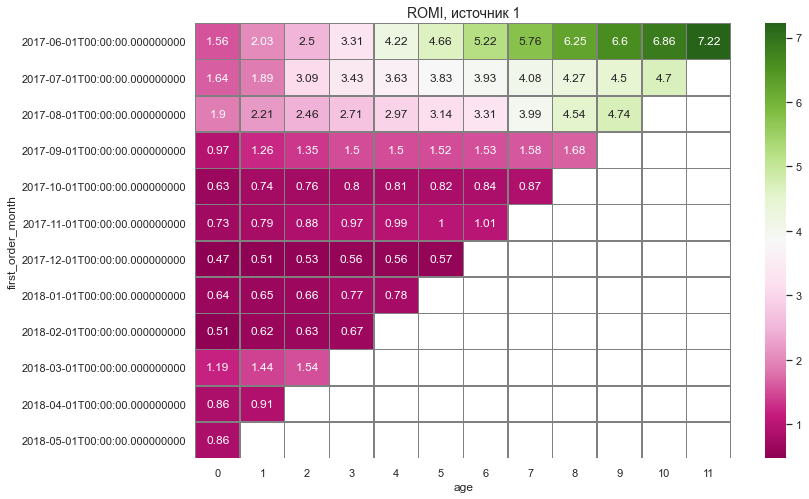

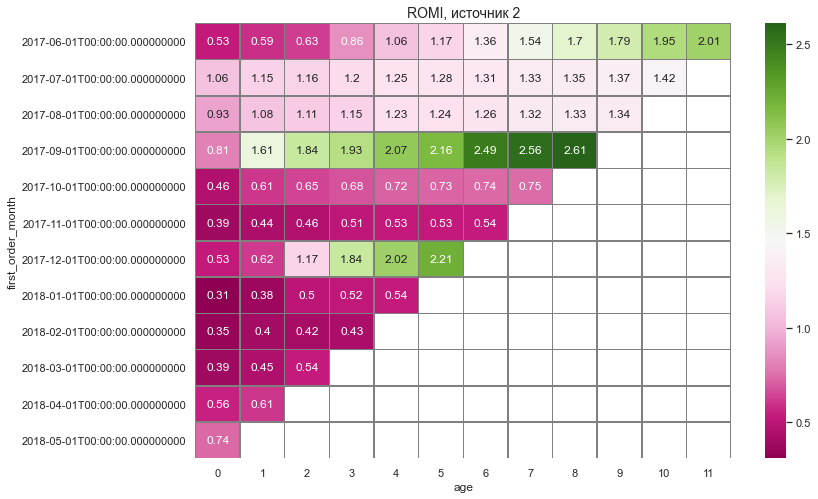

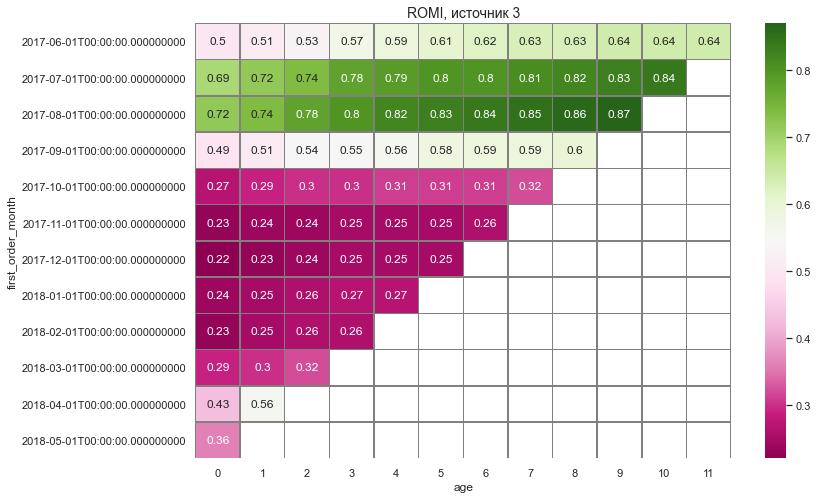

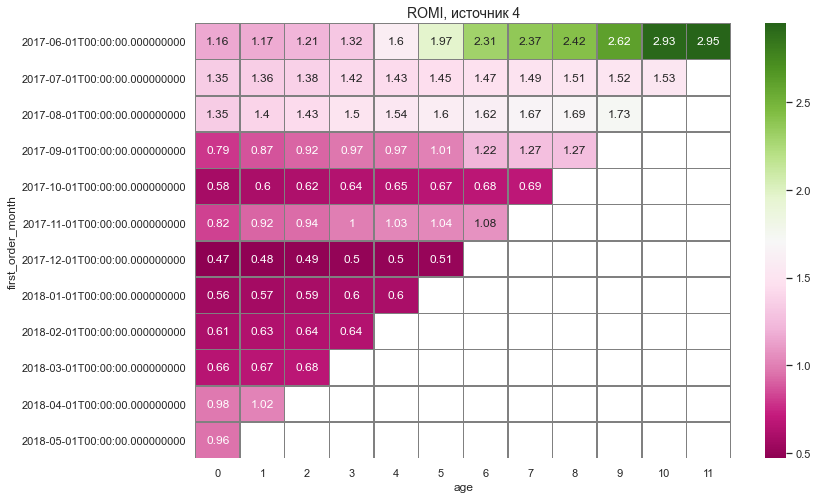

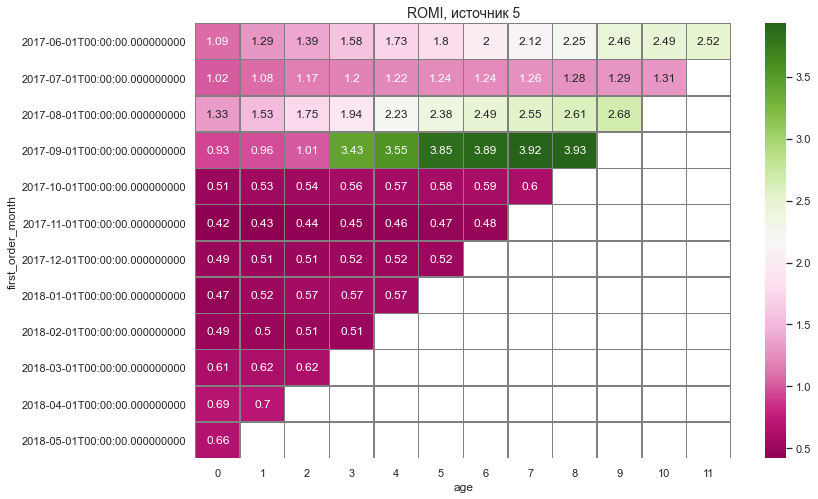

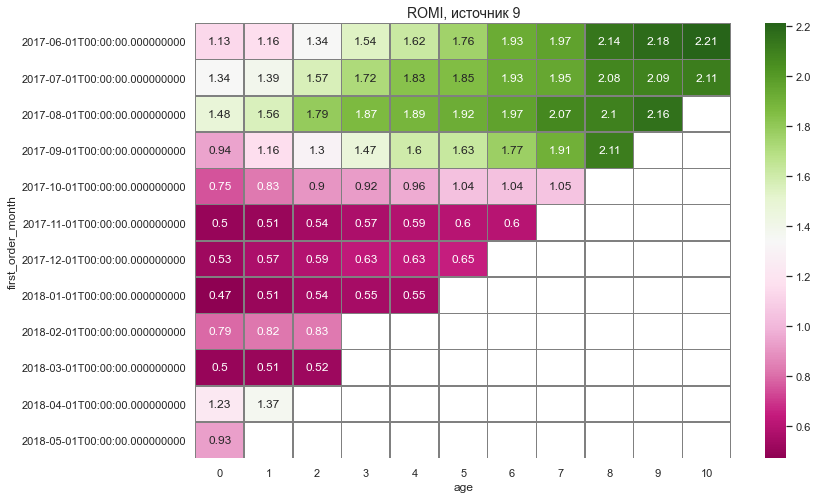

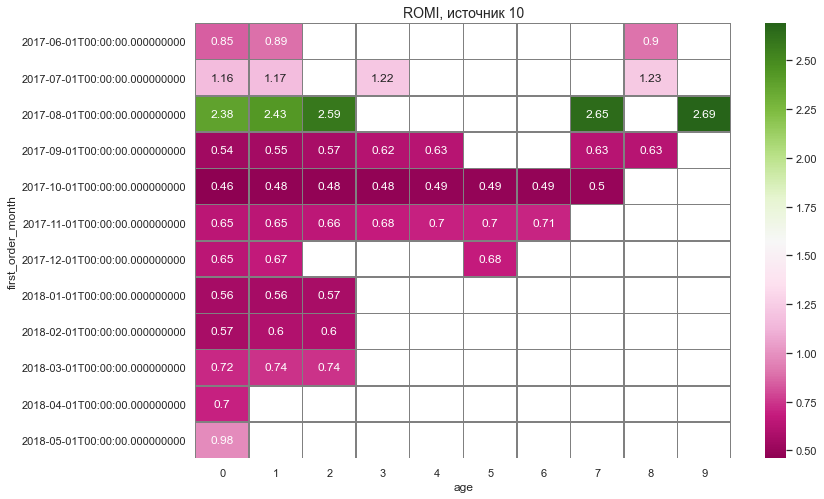

In [121]:
for source in source_dict:
    romi_pivot = (all_for_romi.query('source_id == @source')
                    .pivot_table(index='first_order_month', 
                                 columns='age', 
                                 values='romi', 
                                 aggfunc='mean').cumsum(axis=1).round(2)
                   )
    sns.set(style='white')
    plt.figure(figsize=(12, 8))
    sns.heatmap(romi_pivot, annot=True, fmt='.3g', 
                linewidths=0.5, linecolor='gray', cmap='PiYG')
    plt.title('ROMI, {}'.format(source_dict[source]), fontsize=14)
    plt.show()

На успешную окупаемость июньской когорты наиболее повлиял источник 1, немного источники 4,5 и 9, совсем чуть-чуть источники 3 и 2.
На окупаемость сентябрьской когорты сильно повлиял источник 5 и немного источники 9, 3 и 2.

### Шаг 3. Выводы и рекомендации. <a name="step3" />

Итак, нашей основной задачей проекта было: помочь маркетологам снизить расходы — отказаться от невыгодных источников трафика и перераспределить бюджет. Есть данные Яндекс.Афиши с июня 2017 по конец мая 2018 года: лог сервера с данными о посещениях сайта Яндекс.Афиши, выгрузка всех заказов за этот период, статистика рекламных расходов. Мы изучили:

 - как клиенты пользуются сервисом,
 - когда делают первые покупки на сайте,
 - сколько денег приносит компании каждый клиент,
 - когда расходы на привлечение клиента окупаются. 
 
 Наша работа состояла из нескольких этапов:
 1. Предподготовка данных. Данные достаточно чистые, нет дубликатов и пропусков значений. Мы лишь изменили регистр некоторых столбцов таблиц , вместо пробела подставили знак нижнего подчеркивания и поменяли форматы столбцов, содержащие даты.
 2. Мы расчитали такие показатели, как  DAU, WAU и MAU. Вычислили средние значения этих метрик за весь период. Отобразили изменения метрик во времени на графиках.
 
 
 Мы узнали, что в день среднее значение по количеству пользователей составило 907. Постепенное увеличение с лета до нового года. В декабре мы наблюдаем пик, допускаю, что он связан с закупками перед новым годом . Вероятно именно в это время была очень мощная рекламная кампания. В апреле ощутимый спад, что логично, в апреле ни одного государственного праздника).
 
 Среднее значение по количеству пользователей за неделю составило 5825 человек. Данное укрупнение графика лишь подтверждает наличие сезонности, зимой люди чаще ходят на мероприятия, возможно даже пик пришелся в связи с сезонными детскими елками, а в январе спад кажется логичным, люди торопятся покупать до нового года, чтобы в выходные ни о чем уже не беспокоиться.
 
 Среднее значение пользователей в месяц - 23228. Мы видим самые низкие значения в августе. Предположительно, это связано с началом учебного года. В это время у населения после отпусков и дач деньги остаются только на учебники и форму)) Видимо!
 
 Среднее количество сессий в день составило 987, это чуть больше чем среднее количество пользователей в день.
 
 3. Далее мы выяснили, сколько времени пользователи проводят на сайте и какова продолжительность типичной пользовательской сессии за весь период.
 Мы столкнулись с тем, что наиболее частое значение продолжительности пользовательской сессии составило 1 минуту. И тут возник вопрос к команде разрабочиков: Успевают ли пользователи за минуту совершить какое-либо действие или нет. Чем вызвано данное поведение?
 Мы же помимо моды, посчитали среднее количество минут и медиану, и решили ориентироваться на медианное значение, которое составляет 5 минут.
 То есть продолжительность типичной пользовательской сессии ASL = 5.0 минут.
 
 4. Мы рассчитаем Retention Rate, применяя когортный анализ. Изменение метрики во времени на графике. Средний Retention Rate на второй месяц жизни когорт.
  Мы увидели, что с течением времени пользователи все реже возвращаются, т.е. Rate retention снижается. Самый большой показатель был по сентябрьской когорте в 1 и 2 месяцах. Хотелось бы узнать, что такого предприняли маркетологи в этот момент. Может была какая-то крупная кампания, пересмотр целевой аудитории, рассылка с каким-то заманчивым предложением? 
  Средний Retention Rate на второй месяц «жизни» когорт составил 6.5%
 5. Затем, мы узнали, сколько времени в среднем проходит с момента первого посещения сайта до совершения покупки и пришли к выводу, что большинство покупок совершаются в день посещения.
 6. Мы рассчитали среднее количество покупок на одного покупателя за полгода. Это число составило 1.4
 7. Так же был рассчитан средний чек покупателя. Он составил 4.96 у.е.
 8. Мы выяснили, как меняется LTV на покупателя по когортам.Рассчитали средний LTV по когортам за 6 месяцев
Мы опять наблюдаем удивительные показатели по сентябрьской и июньской когортам. Маркетологи молодцы. Вопрос открытый, что именно сделали маркетологи накануне зимнего периода?
 9. Мы посчитали общую сумму расходов на маркетинг. Выяснили, как траты распределены по источникам. Визуализировали изменения метрик во времени.
 Общие затраты составляют:  329131.62 y.e.
 Затраты немного снижались в августе.Предполагаю, что была учтена сезонность и опыт прошлых лет. И с сентября был резкий подъем расходов. Вспоминаем прошлые графики и мучавший меня вопрос что такого сделали маркетологи. Ответ почти найден: они потратили крупную часть годового бюджета и теперь мы понимаем, что дело не только в сезонности, но и в хорошо простроенной маркетинговой компании. Самый дорогой источник № 3 , затем по убыванию идут источники 4,5 и 2. Источники 1, 9, 10 - самые низкие и практически не меняющиеся от месяца к месяцу.
 10. Мы произвели рассчет среднего CAC на одного покупателя для всего проекта и для каждого источника трафика. Отражение изменений метрик на графиках.
 Средняя стоимость привлечения одного клиента составила 9,32 у.е. Мы увидели, что стоимость привлечения росла к сентябрю.
 И выяснили, что дороже всего нам обходятся клиенты, привлеченные третьим и вторым источником. Источники 9 и 10 имеют низкие затраты. А 6,7 и 8 - либо бесплатные либо неиспользуемые)
 11.Мы осуществили рассчет ROMI по когортам в разрезе источников. Сравнили окупаемости за одинаковые периоды жизни когорт. Построили графики, отражающие изменения метрик во времени.
 На успешную окупаемость июньской когорты наиболее повлиял источник 1, немного источники 4,5 и 9, совсем чуть-чуть источники 3 и 2.
На окупаемость сентябрьской когорты сильно повлиял источник 5 и немного источники 9, 3 и 2.
 Мои рекомендации маркетологам по распределению бюджета таковы: Снизить расходы на 3 и 2 источники, они в числе самых дорогих и самых низко окупаемых. И увеличить расходы по источникам 1 и 5, как на саммые эффективные. Ну и продолжать использовать источники 9 и 10, т.к. они самые низкие по стоимости, но так же достаточно эффективные!
 
 
 